In [3]:
from hcipy import *
from progressbar import progressbar

import numpy as np
import matplotlib.pyplot as plt
import scipy.ndimage as ndimage
import time
import os

%matplotlib inline

In [4]:
telescope_diameter = 8. # meter
central_obscuration = 1.2 # meter
central_obscuration_ratio = central_obscuration / telescope_diameter
spider_width = 0.05 # meter
oversizing_factor = 16 / 15

In [5]:
num_pupil_pixels = 240 * oversizing_factor
pupil_grid_diameter = telescope_diameter * oversizing_factor
pupil_grid = make_pupil_grid(num_pupil_pixels, pupil_grid_diameter)

VLT_aperture_generator = make_obstructed_circular_aperture(telescope_diameter,
    central_obscuration_ratio, num_spiders=4, spider_width=spider_width)

VLT_aperture = evaluate_supersampled(VLT_aperture_generator, pupil_grid, 4)

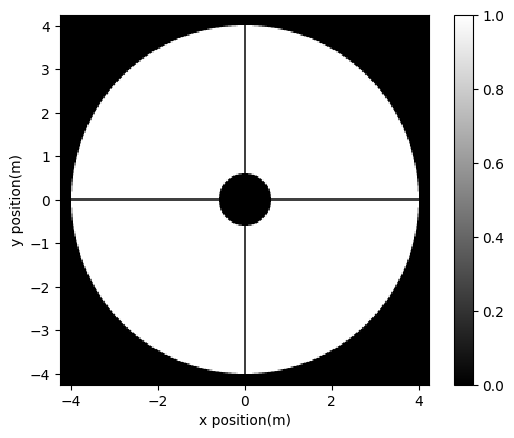

In [6]:
imshow_field(VLT_aperture, cmap='gray')
plt.xlabel('x position(m)')
plt.ylabel('y position(m)')
plt.colorbar()
plt.show()

In [7]:
wavelength_wfs = 0.7e-6
wavelength_sci = 2.2e-6
wf = Wavefront(VLT_aperture, wavelength_sci)
wf.total_power = 1

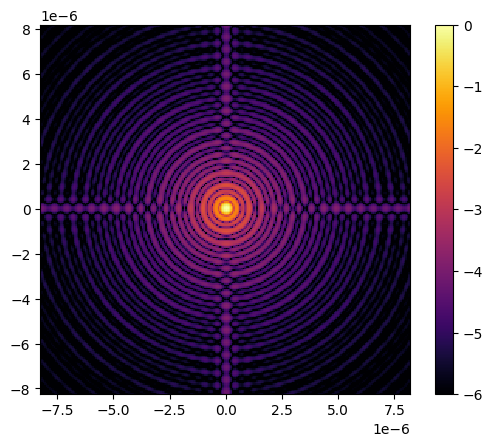

In [8]:
spatial_resolution = wavelength_sci / telescope_diameter
focal_grid = make_focal_grid(q=4, num_airy=30, spatial_resolution=spatial_resolution)

propagator = FraunhoferPropagator(pupil_grid, focal_grid)

unaberrated_PSF = propagator.forward(wf).power

imshow_field(np.log10(unaberrated_PSF / unaberrated_PSF.max()), cmap='inferno', vmin=-6)
plt.colorbar()
plt.show()

In [9]:
f_number = 50
num_lenslets = 40 # 40 lenslets along one diameter
sh_diameter = 5e-3 # m

# Zooms in on the microlens array
magnification = sh_diameter / telescope_diameter
magnifier = Magnifier(magnification)

In [10]:
shwfs = SquareShackHartmannWavefrontSensorOptics(pupil_grid.scaled(magnification), f_number, \
                                                 num_lenslets, sh_diameter)
shwfse = ShackHartmannWavefrontSensorEstimator(shwfs.mla_grid, shwfs.micro_lens_array.mla_index)

In [22]:
camera = NoiselessDetector(focal_grid)

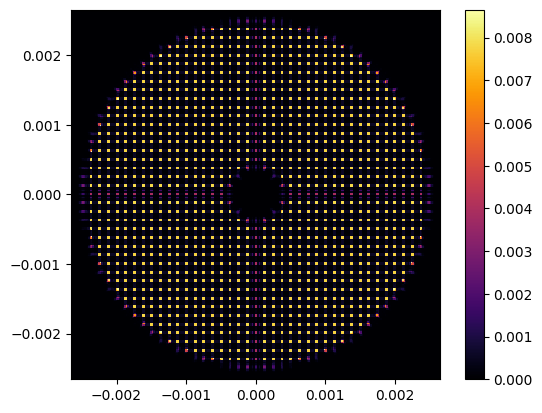

In [23]:
wf = Wavefront(VLT_aperture, wavelength_wfs)
camera.integrate(shwfs(magnifier(wf)), 1)

image_ref = camera.read_out()

imshow_field(image_ref, cmap='inferno')
plt.colorbar()
plt.show()

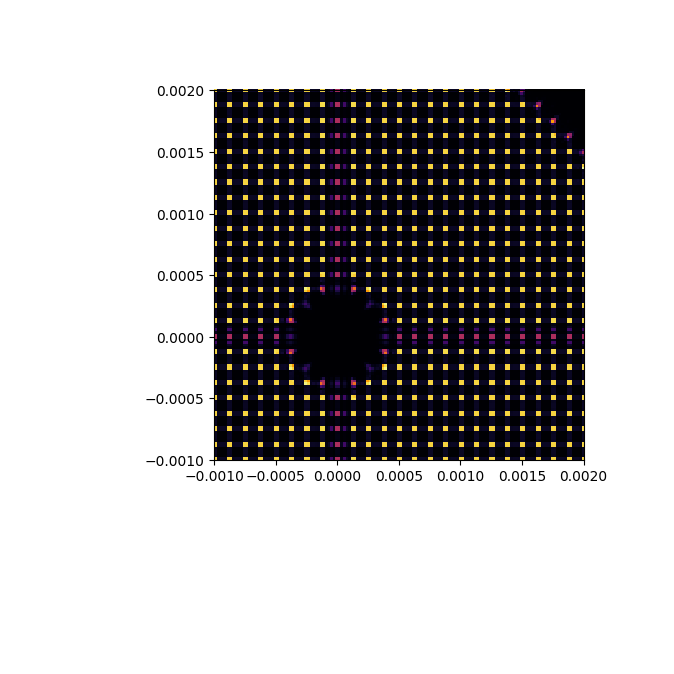

In [24]:
imshow_field(image_ref, cmap='inferno')
plt.xlim(-0.001, 0.002)
plt.ylim(-0.001, 0.002)
plt.show()

In [25]:

# For each subaperture (i.e., each lenslet), sum the pixel values in image_ref that correspond to that subaperture.
fluxes = ndimage.measurements.sum(image_ref, shwfse.mla_index, shwfse.estimation_subapertures)

# Only subapertures with at least half the maximum flux will be considered "good" for wavefront estimation.
flux_limit = fluxes.max() * 0.5

# Mark as True those subapertures whose flux is above the threshold.
estimation_subapertures = shwfs.mla_grid.zeros(dtype='bool')
estimation_subapertures[shwfse.estimation_subapertures[fluxes > flux_limit]] = True

# Re-create the estimator, telling it to only use the selected subapertures for slope estimation.
shwfse = ShackHartmannWavefrontSensorEstimator(shwfs.mla_grid, shwfs.micro_lens_array.mla_index, estimation_subapertures)

C:\Users\alexe\AppData\Local\Temp\ipykernel_42260\320501535.py:2: DeprecationWarning: Please import `sum` from the `scipy.ndimage` namespace; the `scipy.ndimage.measurements` namespace is deprecated and will be removed in SciPy 2.0.0.
  fluxes = ndimage.measurements.sum(image_ref, shwfse.mla_index, shwfse.estimation_subapertures)


In [26]:
slopes_ref = shwfse.estimate([image_ref])

In [28]:
num_modes = 500

# Creating orthogonal modes for correcting.
# Disk harmonic modes with 'neumann' or 'dirichlet' boundary conditions can be tailored 
#    to match the physical constraints of your deformable mirror (DM), such as zero slope or zero value at the edge. 
# Zernike modes are also orthogonal, but only for a perfect, unobstructed, circular pupil.
dm_modes = make_disk_harmonic_basis(pupil_grid, num_modes, telescope_diameter, 'neumann')

# Normalizing each mode with the peak-to-peak value (max - min)
dm_modes = ModeBasis([mode / np.ptp(mode) for mode in dm_modes], pupil_grid)

deformable_mirror = DeformableMirror(dm_modes)

In [ ]:
probe_amp = 0.01 * wavelength_wfs
response_matrix = []

wf = Wavefront(VLT_aperture, wavelength_wfs)
wf.total_power = 1

# Set up animation
plt.figure(figsize=(10, 6))
anim = FFMpegWriter("dm_modes_animation.mp4", framerate=5)

for i in (range(num_modes)):
    slope = 0

    # Probe the phase response
    amps = [-probe_amp, probe_amp]
    for amp in amps:
        # Resets deformable mirror to 0 (flattens it)
        deformable_mirror.flatten()

        # Each index represents one orthogonal harmonic mode
        deformable_mirror.actuators[i] = amp

        dm_wf = deformable_mirror.forward(wf)
        wfs_wf = shwfs(magnifier(dm_wf))

        # Produces an image as if the camera was exposed to the light for this amount of time.
        camera.integrate(wfs_wf, 1)
        image = camera.read_out()

        slopes = shwfse.estimate([image])

        slope += amp * slopes / np.var(amps)

    response_matrix.append(slope.ravel())

    # Only show all modes for the first 40 modes
    if i > 40 and (i + 1) % 20 != 0:
        continue

    # Plot mode response
    plt.clf()
    plt.suptitle('Mode %d / %d: DM shape' % (i + 1, num_modes))

    plt.subplot(1,2,1)
    plt.title('DM surface')
    im1 = imshow_field(deformable_mirror.surface, cmap='RdBu', mask=VLT_aperture)

    plt.subplot(1,2,2)
    plt.title('SH spots')
    im2 = imshow_field(image)
    plt.quiver(shwfs.mla_grid.subset(shwfse.estimation_subapertures).x,
        shwfs.mla_grid.subset(shwfse.estimation_subapertures).y,
        slope[0,:], slope[1,:],
        color='white')

    anim.add_frame()

response_matrix = ModeBasis(response_matrix)

plt.close()
anim.close()

# Show created animation
anim

In [ ]:
rcond = 1e-3

reconstruction_matrix = inverse_tikhonov(response_matrix.transformation_matrix, rcond=rcond)
print(reconstruction_matrix.shape)

(500, 2432)


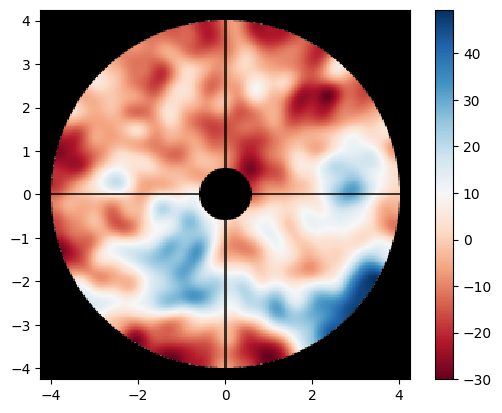

In [ ]:
# Put actuators at random values, putting a little more power in low-order modes
deformable_mirror.actuators = np.random.randn(num_modes)  / (np.arange(num_modes) + 10)

# Normalize the DM surface so that we get a reasonable surface RMS.
deformable_mirror.actuators *= 0.3 * wavelength_sci / np.std(deformable_mirror.surface)

imshow_field(deformable_mirror.phase_for(wavelength_wfs), mask=VLT_aperture, cmap='RdBu')
plt.colorbar()
plt.show()

In [ ]:
zero_magnitude_flux = 3.9e10 #3.9e10 photon/s for a mag 0 star
stellar_magnitude = 5
delta_t = 1e-3 # sec, so a loop speed of 1kHz.

# Real adaptive optics systems often sense the wavefront at one wavelength (visible) and do science at another (infrared).
# This allows you to simulate and compare how well the correction (based on the WFS wavelength) works at the science wavelength, 
#    which is important because the DM correction is not always perfect across all wavelengths (chromatic effects).
wf_wfs = Wavefront(VLT_aperture, wavelength_wfs)
wf_sci = Wavefront(VLT_aperture, wavelength_sci)

wf_wfs.total_power = zero_magnitude_flux * 10**(-stellar_magnitude / 2.5)
wf_sci.total_power = zero_magnitude_flux * 10**(-stellar_magnitude / 2.5)

print("Photon flux per WFS frame {:g}".format(wf_wfs.total_power * delta_t))

Photon flux per WFS frame 390000


In [ ]:
# Adds some noise again.
deformable_mirror.actuators = np.random.randn(num_modes) / (np.arange(num_modes) + 10)
deformable_mirror.actuators *= 0.3 * wavelength_sci / np.std(deformable_mirror.surface)

gain = 0.6
leakage = 0.01
num_iterations = 20

long_exposure = 0

# Set up animation
plt.figure(figsize=(8, 8))
anim = FFMpegWriter('AO_simulation_without_turbulence.mp4', framerate=10)

for timestep in (range(num_iterations)):
    # Propagate through SH-WFS
    wf_after_sh = shwfs(magnifier(deformable_mirror(wf_wfs)))

    # Propagate the NIR wavefront
    wf_sci_after_dm = propagator(deformable_mirror(wf_sci))

    # Read out WFS camera
    camera.integrate(wf_after_sh, delta_t)
    wfs_image = camera.read_out()
    wfs_image = large_poisson(wfs_image).astype('float')

    # Calculate slopes from WFS image
    slopes = shwfse.estimate([wfs_image + 1e-10])
    slopes -= slopes_ref
    slopes = slopes.ravel()

    # Perform wavefront control and set DM actuators
    deformable_mirror.actuators = (1 - leakage) * deformable_mirror.actuators - gain * reconstruction_matrix.dot(slopes)

    # Plotting
    plt.clf()
    plt.suptitle('Timestep %d / %d' % (timestep, num_iterations))

    plt.subplot(2,2,1)
    plt.title('DM surface [$\\mu$m]')
    imshow_field(deformable_mirror.surface * 1e6, cmap='RdBu', vmin=-1, vmax=1, mask=VLT_aperture)
    plt.colorbar()

    plt.subplot(2,2,2)
    plt.title('WFS image [counts]')
    imshow_field(wfs_image, cmap='inferno')
    plt.colorbar()

    plt.subplot(2,2,3)
    plt.title('Instantaneous PSF at 2.2$\\mu$m [log]')
    imshow_field(np.log10(wf_sci_after_dm.power / wf_sci_after_dm.power.max()), vmin=-6, vmax=0, cmap='inferno')
    plt.colorbar()

    anim.add_frame()

plt.close()
anim.close()

# Show created animation
anim

In [ ]:
seeing = 0.6 # arcsec @ 500nm (convention)
outer_scale = 40 # meter
tau0 = 0.005 # seconds

fried_parameter = seeing_to_fried_parameter(seeing)
Cn_squared = Cn_squared_from_fried_parameter(fried_parameter, 500e-9)
velocity = 0.314 * fried_parameter / tau0

print('r0   = {0:.1f}cm'.format(fried_parameter * 100))
print('L0   = {0:.1f}m'.format(outer_scale))
print('tau0 = {0:.1f}ms'.format(tau0 * 1000))
print('v    = {0:.1f}m/s'.format(velocity))

r0   = 16.8cm
L0   = 40.0m
tau0 = 5.0ms
v    = 10.6m/s


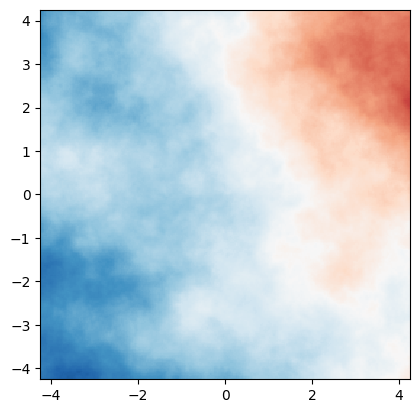

In [ ]:
layer = InfiniteAtmosphericLayer(pupil_grid, Cn_squared, outer_scale, velocity)

phase_screen_phase = layer.phase_for(wavelength_wfs) # in radian
phase_screen_opd = phase_screen_phase * (wavelength_wfs / (2 * np.pi)) * 1e6

imshow_field(phase_screen_opd, vmin=-6, vmax=6, cmap='RdBu')

In [ ]:
plt.figure(figsize=(5, 4))
anim = FFMpegWriter('atmospheric_turbulence.mp4', framerate=5)

t_end = 1
n = 51
for t in np.linspace(0, t_end, n):
    layer.t = t

    phase_screen_phase = layer.phase_for(wavelength_wfs) # in radian
    phase_screen_opd = phase_screen_phase * (wavelength_wfs / (2 * np.pi)) * 1e6 # in um

    plt.clf()
    plt.suptitle('Time %.3f s' % t)

    plt.subplot(1,1,1)
    plt.title('Turbulent wavefront [$\\mu$m]')
    imshow_field(phase_screen_opd, vmin=-6, vmax=6, cmap='RdBu')
    plt.colorbar()

    anim.add_frame()

plt.close()
anim.close()

# Show created animation
anim

In [ ]:
layer.reset()
deformable_mirror.flatten()

gain = 0.3
leakage = 0.01
num_iterations = 750
burn_in_iterations = 5

coro = PerfectCoronagraph(VLT_aperture, 20)

long_exposure = focal_grid.zeros()
long_exposure_coro = focal_grid.zeros()

# Set up animation
plt.figure(figsize=(8, 8))
anim = FFMpegWriter('AO_simulation_with_turbulence.mp4', framerate=10)

for timestep in (range(num_iterations)):
    layer.t = timestep * delta_t

    # Propagate through atmosphere and deformable mirror.
    wf_wfs_after_atmos = layer(wf_wfs)
    wf_wfs_after_dm = deformable_mirror(wf_wfs_after_atmos)

    # Propagate through SH-WFS
    wf_wfs_on_sh = shwfs(magnifier(wf_wfs_after_dm))

    # Propagate the NIR wavefront
    wf_sci_focal_plane = propagator(deformable_mirror(layer(wf_sci)))
    wf_sci_coro = propagator(coro(deformable_mirror(layer(wf_sci))))

    # Read out WFS camera
    camera.integrate(wf_wfs_on_sh, delta_t)
    wfs_image = camera.read_out()
    wfs_image = large_poisson(wfs_image).astype('float')

    # Accumulate long-exposure image
    if timestep >= burn_in_iterations:
        long_exposure += wf_sci_focal_plane.power / (num_iterations - burn_in_iterations)
        long_exposure_coro += wf_sci_coro.power / (num_iterations - burn_in_iterations)

    # Calculate slopes from WFS image
    slopes = shwfse.estimate([wfs_image + 1e-10])
    slopes -= slopes_ref
    slopes = slopes.ravel()

    # Perform wavefront control and set DM actuators
    deformable_mirror.actuators = (1 - leakage) * deformable_mirror.actuators - gain * reconstruction_matrix.dot(slopes)

    # Plotting
    if timestep % 20 == 0:
        plt.clf()

        plt.suptitle('Timestep %d / %d' % (timestep, num_iterations))

        plt.subplot(2,2,1)
        plt.title('DM surface [$\\mu$m]')
        imshow_field(deformable_mirror.surface * 1e6, cmap='RdBu', vmin=-2, vmax=2, mask=VLT_aperture)
        plt.colorbar()

        plt.subplot(2,2,2)
        plt.title('WFS image [counts]')
        imshow_field(wfs_image, cmap='inferno')
        plt.colorbar()

        plt.subplot(2,2,3)
        plt.title('Instantaneous PSF at 2.2$\\mu$m [log]')
        imshow_field(np.log10(wf_sci_focal_plane.power/ wf_sci_focal_plane.power.max()), vmin=-6, vmax=0, cmap='inferno') #
        plt.colorbar()

        if timestep >= burn_in_iterations:
            plt.subplot(2,2,4)
            plt.title('Average PSF at 2.2$\\mu$m [log]')
            imshow_field(np.log10(long_exposure_coro / long_exposure.max()), vmin=-6, vmax=0, cmap='inferno')
            plt.colorbar()

        anim.add_frame()

plt.close()
anim.close()

# Show created animation
anim